# Modified TPC-H Q1 Microbenchmark
This file is adapted to use numpy only without Spark.

```sql
select
  sum(l_quantity) as sum_qty,
  sum(l_extendedprice) as sum_base_price,
  sum(l_extendedprice * (1 - l_discount)) as sum_disc_price,
  sum(l_extendedprice * (1 - l_discount) * (1 + l_tax)) as sum_charge,
  avg(l_quantity) as avg_qty,
  avg(l_extendedprice) as avg_price,
  avg(l_discount) as avg_disc,
  count(*) as count_order
from
  lineitem
where
  l_shipdate <= '1998-09-02'
  and l_returnflag = 'A'
  and l_linestatus = 'F'
```

In [226]:
EXPERIMENT = 'pac-q1-svd'
OUTPUT_DIR = f'./outputs/{EXPERIMENT}'
GENERATE = True
USE_EVEN_NUMBER_OF_INPUT_ROWS = False
SEED_RANDOM_NUMBER_GENERATOR = True

SAMPLING_METHOD = 'poisson' # 'poisson' or 'half'

if GENERATE:
    print("GENERATE = True, so we will generate new samples.")
else:
    print("GENERATE = False, so we will load saved output from files rather than recomputing.")

import os
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)


GENERATE = True, so we will generate new samples.


### Running PAC

In [227]:
from typing import Any, Callable, Dict, List, Tuple, Union

import numpy as np
if SEED_RANDOM_NUMBER_GENERATOR:
    np.random.seed(0)

import pandas as pd
from pandas import DataFrame
import concurrent.futures
import pyarrow as pa
import pyarrow.parquet as pq
import pickle
from numpy.random import laplace
from functools import reduce
import operator
from IPython.display import display, HTML
from datetime import date
from scipy import special

In [228]:
### Mayuri's conversion functions between DP epsilon and PAC MI using posterior advantage for equivalence
def calc_posterior(mi, prior=0.5, prec = 100000):
    test_vals = [x / prec for x in range(1, prec)]
    max_t = None
    for t in test_vals:
        if t*np.log(t/prior)+(1-t)*np.log((1-t)/(1-prior)) <= mi:
            if  max_t is None or t > max_t:
                max_t = t
    return max_t

def dp_epsilon_to_posterior_success(epsilon):
    return 1 - 1./(1+np.exp(epsilon))

def dp_ps_to_epsilon(ps):
    return np.log(ps / (1-ps))

# example usage:
# dp_ps_to_epsilon(calc_posterior(1/256.))

In [229]:
### Data Setup
#por_df = pq.read_table(f"./data/student_performance/student-por.parquet").to_pandas()
lineitem_df = pd.read_parquet('data/tpch/lineitem.parquet')

lineitem_df.shape

(600572, 16)

In [230]:
type(lineitem_df['l_linestatus'][0])

str

In [231]:
def runquery(lineitem_df: DataFrame) -> int:
    # 1. Filter lineitem rows where commit date is before receipt date.
    lineitem_filtered = lineitem_df[
        (lineitem_df['l_shipdate'] <= date(1998, 9, 2)) &
        (lineitem_df['l_returnflag'] == 'A') &
        (lineitem_df['l_linestatus'] == 'F')
    ]
    print(lineitem_filtered.shape)

    # 2. Pre-compute
    discounted_price = lineitem_filtered['l_extendedprice'] * (1 - lineitem_filtered['l_discount'])
    charged_price = discounted_price * (1 + lineitem_filtered['l_tax'])

    # 3. Get aggregations
    aggregated_result = [
        float(lineitem_filtered['l_quantity'].sum()),       # sum_qty
        float(lineitem_filtered['l_extendedprice'].sum()),  # sum_base_price
        float(discounted_price.sum()),                      # sum_disc_price
        float(charged_price.sum()),                         # sum_charge
        float(lineitem_filtered['l_quantity'].mean()),      # avg_qty
        float(lineitem_filtered['l_extendedprice'].mean()), # avg_price
        float(lineitem_filtered['l_discount'].mean()),      # avg_disc
        float(len(lineitem_filtered))                       # count_order (faster than .count())
    ]

    # print(aggregated_result)

    return aggregated_result
runquery(lineitem_df)

(147790, 16)


[3774200.0,
 5320753880.69,
 5054096266.6828,
 5256751331.449234,
 25.537587116854997,
 36002.12382901414,
 0.05014459706340077,
 147790.0]

In [232]:
### Query Setup
SAMPLES = 30
assert SAMPLES % 2 == 0, "We need an even number of samples for paired sampling."
number_of_pairs = SAMPLES // 2

OUTPUT_COLS = ['sum_qty', 'sum_base_price', 'sum_disc_price', 'sum_charge', 'avg_qty', 'avg_price', 'avg_disc', 'count_order']

true_result = np.array(runquery(lineitem_df)) # Save the true result of the query for later
#true_result = np.divide(true_result, 2) # manually correct count = count * 2

number_of_contributing_rows = 147790  # hardcode number of eligible rows

def poisson_paired_sample(df: DataFrame) -> Tuple[DataFrame, DataFrame]:
    """
    This will select a subset of indices, where each index is selected with probability 0.5.
    The first result is the dataframe composed of the selected rows.
    The second result is the complement / the dataframe composed of the rows that were not selected.
    """
    mask = np.random.random_sample(len(df)) < 0.5  # Generates a bitmask of length df.shape[0] where each bit is 1 with probability 0.5
    selected = df[mask]
    not_selected = df[~mask]
    return selected, not_selected

def half_paired_sample(df: DataFrame) -> Tuple[DataFrame, DataFrame]:
    """
    This will select half of the row indices from the dataframe at random.
    The first result is the dataframe composed of the selected rows.
    The second result is the complement / the dataframe composed of the rows that were not selected.
    """
    indices = np.random.choice(df.index, size=(df.shape[0] // 2), replace=False)
    not_indices = list(set(df.index) - set(indices))
    selected: DataFrame = df.loc[indices]
    not_selected: DataFrame = df.loc[not_indices]
    return (selected, not_selected)

def sample_using_chosen_method(df: DataFrame) -> Tuple[DataFrame, DataFrame]:
    if SAMPLING_METHOD == 'poisson':
        return poisson_paired_sample(df)
    elif SAMPLING_METHOD == 'half':
        return half_paired_sample(df)

def generate_samples(laplace_lambda: float = 1.0, alpha: int = 10) -> List[np.ndarray]:
    # Apply thresholding: if there are less than alpha samples
    # (with some Laplacian noise), then we don't subsample and return None.
    laplace_noise: float = np.random.laplace(scale=laplace_lambda)

    if number_of_contributing_rows + laplace_noise < alpha:  # if we don't get enough results from the query
        print("There are not enough rows contributing to the result for PAC to be meaningful.")
        return []
    
    number_of_pairs = SAMPLES // 2
    out_np: List[np.ndarray] = []
    for i in range(number_of_pairs):
        print(f'iteration : {i}')
        for temp_df in sample_using_chosen_method(lineitem_df.reset_index(drop=True)):  # reset index to sequential
            out = runquery(temp_df)
            # double the sums and counts, avg stays the same
            out[0] *= 2
            out[1] *= 2
            out[2] *= 2
            out[3] *= 2
            out[7] *= 2
            # for a 2d array, flatten it
            out_np.append(np.array(out))
    # Debug: SVD new (not needed I think??)
    # out_np = reduce(operator.iconcat, out_np, [])

    return out_np

(147790, 16)


In [233]:
### Compute PAC Noise
def get_pac_noise_scale(out_np_raw: List[np.ndarray],
                           max_mi: float = 1./4, use_svd: bool = False) -> np.ndarray:
    if out_np_raw is None or len(out_np_raw) == 0:
        raise ValueError("Input list out_np cannot be empty.")
    out_np = out_np_raw.copy()
    # print(out_np)
    dimensions: int = len(out_np[0])
    print(f'The dimensions are - {dimensions}')

    out_np_2darr = [np.atleast_2d(o) for o in out_np] # make sure all the DF -> np.ndarray conversions result in 2d arrays
    print(out_np_2darr)
    est_y: np.ndarray = np.stack(out_np_2darr, axis=-1).reshape(dimensions, len(out_np))  # shape (dimensions, samples)
    print(f"est_y.shape: {est_y.shape}")
    print(f"est_y: {est_y}")

    # Debug: SVD new
    if use_svd:
        cov = np.cov(est_y)
        fin_var, u = np.linalg.eig(cov)
    else:
        u = None

    test_var = np.sum(np.sqrt(np.var(est_y, axis=1)))

    # confirm one is lesser than the other
    sqrt_total_var: np.floating[Any] = np.sum(np.sqrt(fin_var))
    if (sqrt_total_var > test_var):
        print("ALERT")
    pac_noise: np.ndarray = (1./(2*max_mi)) * sqrt_total_var * np.sqrt(fin_var)  # variance of the PAC noise
        
    return pac_noise, u


To replicate the experiment that runs for epsilon=0.01, 0.1, 1, 10
we use mi=1, 1/4, 1/16, 1/64, 1/256 in the hopes of encompassing a similar range.

In [234]:
MI_OPTIONS = [0.001248318631131131, 1/64, 1/32, 1/16, 1/4, 1., 2., 4., 16.]
EXPERIMENTS = 10

if GENERATE:
    experiment_results = []
    saved_steps = []

    # out_np = generate_samples() # generate samples (results of running the query)
    # print(f"Generate samples... {len(out_np)} samples generated.")

    # print(out_np[0])

    for mi in MI_OPTIONS:
        print("Getting PAC Noise...")
        pac_noise, u = get_pac_noise_scale(out_np, mi, use_svd=True) # estimate the stability of the query
        # print(f"mi={mi}, scale={pac_noise}")
        
        for e in range(EXPERIMENTS):
    
            # for each PAC release at this MI, we will choose a sample from the pre-generated out_np list and add noise to it
            steps = {
                "mi": mi,
                "scale": pac_noise
            }

            # choose our sample
            chosen_index = np.random.choice(range(SAMPLES))
            chosen_sample = out_np[chosen_index].copy()
            steps["chosen_sample"] = chosen_sample

            pac_noise = np.matmul(np.matmul(u, pac_noise), u.T)
            pac_noises_to_add: np.ndarray = np.random.normal(loc=0, scale=np.sqrt(pac_noise))

            steps["chosen_noise"] = pac_noises_to_add
            
            print(f'Chosen Sample {chosen_sample}')
            # chosen_sample = np.array([float(x) for x in chosen_sample], dtype=np.float64)
            release = chosen_sample + pac_noises_to_add 

            #print(f"sample(#{chosen_index}):{chosen_sample} + noise:{chosen_noise} = {release}")
            steps["release"] = release
            
            # manually add sum as count * mean
            
            experiment_results.append([mi, *release])
            saved_steps.append(steps)
    
    df = pd.DataFrame(experiment_results, columns=['mi', *OUTPUT_COLS])
    
    # Save the new data to outputs/...
    df.to_parquet(f'{OUTPUT_DIR}/pac_results.parquet')
    with open(f'{OUTPUT_DIR}/experiment_results.pkl', 'wb') as f:
        pickle.dump(experiment_results, f)
    with open(f'{OUTPUT_DIR}/saved_steps.pkl', 'wb') as f:
        pickle.dump(saved_steps, f)
else:
    df = pq.read_table(f"{OUTPUT_DIR}/pac_results.parquet").to_pandas()

    with open(f'{OUTPUT_DIR}/experiment_results.pkl', 'rb') as f:
        experiment_results = pickle.load(f)
    with open(f'{OUTPUT_DIR}/saved_steps.pkl', 'rb') as f:
        saved_steps = pickle.load(f)

# df.head()

Getting PAC Noise...
The dimensions are - 8
[array([[3.76986800e+06, 5.31825915e+09, 5.05263840e+09, 5.25522537e+09,
        2.55813202e+01, 3.60882902e+04, 5.00074643e-02, 1.47368000e+05]]), array([[3.77853200e+06, 5.32324861e+09, 5.05555414e+09, 5.25827729e+09,
        2.54941030e+01, 3.59164482e+04, 5.02809489e-02, 1.48212000e+05]]), array([[3.77564200e+06, 5.32335525e+09, 5.05692265e+09, 5.25916564e+09,
        2.55739928e+01, 3.60572980e+04, 5.00857514e-02, 1.47636000e+05]]), array([[3.77275800e+06, 5.31815252e+09, 5.05126989e+09, 5.25433702e+09,
        2.55012572e+01, 3.59470645e+04, 5.02033202e-02, 1.47944000e+05]]), array([[3.77377600e+06, 5.31962160e+09, 5.05351049e+09, 5.25651699e+09,
        2.55475101e+01, 3.60124943e+04, 5.01150857e-02, 1.47716000e+05]]), array([[3.77462400e+06, 5.32188616e+09, 5.05468205e+09, 5.25698568e+09,
        2.55276741e+01, 3.59917638e+04, 5.01740789e-02, 1.47864000e+05]]), array([[3.77953400e+06, 5.32392994e+09, 5.05618576e+09, 5.25921345e+09,
 

/var/folders/g4/jxkqkb_d5170qh291jwd0t_h0000gn/T/ipykernel_79564/5033217.py:32: RuntimeWarning: invalid value encountered in sqrt
  pac_noises_to_add: np.ndarray = np.random.normal(loc=0, scale=np.sqrt(pac_noise))


[array([[3.76986800e+06, 5.31825915e+09, 5.05263840e+09, 5.25522537e+09,
        2.55813202e+01, 3.60882902e+04, 5.00074643e-02, 1.47368000e+05]]), array([[3.77853200e+06, 5.32324861e+09, 5.05555414e+09, 5.25827729e+09,
        2.54941030e+01, 3.59164482e+04, 5.02809489e-02, 1.48212000e+05]]), array([[3.77564200e+06, 5.32335525e+09, 5.05692265e+09, 5.25916564e+09,
        2.55739928e+01, 3.60572980e+04, 5.00857514e-02, 1.47636000e+05]]), array([[3.77275800e+06, 5.31815252e+09, 5.05126989e+09, 5.25433702e+09,
        2.55012572e+01, 3.59470645e+04, 5.02033202e-02, 1.47944000e+05]]), array([[3.77377600e+06, 5.31962160e+09, 5.05351049e+09, 5.25651699e+09,
        2.55475101e+01, 3.60124943e+04, 5.01150857e-02, 1.47716000e+05]]), array([[3.77462400e+06, 5.32188616e+09, 5.05468205e+09, 5.25698568e+09,
        2.55276741e+01, 3.59917638e+04, 5.01740789e-02, 1.47864000e+05]]), array([[3.77953400e+06, 5.32392994e+09, 5.05618576e+09, 5.25921345e+09,
        2.55349764e+01, 3.59690971e+04, 5.022

In [235]:
saved_steps_df_temp = pd.DataFrame(saved_steps)
saved_steps_df_temp.head()

,mi,scale,chosen_sample,chosen_noise,release
0,0.001248,"[3.2673305221724806e+17, 5664581361006928.0, 2...","[3765636.0, 5310059481.6, 5044284618.4654, 524...","[496181526.00687706, nan, nan, 33686317.024541...","[499947162.00687706, nan, nan, 5280049363.7339..."
1,0.001248,"[1.9529013413909853e+17, -1.0216655349063214e+...","[3765636.0, 5310059481.6, 5044284618.4654, 524...","[nan, -102459306.54103635, nan, 615164938.4061...","[nan, 5207600175.058964, nan, 5861527985.11559..."
2,0.001248,"[-9529384377503708.0, 4.102170865102355e+16, -...","[3757416.0, 5289365839.1, 5023824586.753, 5224...","[162153664.69965568, 444451559.4235559, 451170...","[165911080.69965568, 5733817398.523557, 547499..."
3,0.001248,"[1.926481108984394e+16, 2.201802584836356e+17,...","[3790984.0, 5352141922.28, 5084367946.6126, 52...","[1107055811.8464043, -593702908.7179517, 17486...","[1110846795.8464043, 4758439013.562048, 510185..."
4,0.001248,"[2.3789275367953427e+17, 1.6664455250502922e+1...","[3776102.0, 5321479506.86, 5054615349.6596, 52...","[460030459.65435064, nan, nan, 93861967.369650...","[463806561.65435064, nan, nan, 5350866107.2483..."


In [236]:
### Reconstruct Saved Steps
# Get list of keys from the first dict, excluding 'mi' since it's not a list
steps = [k for k in saved_steps[0].keys() if k not in ('mi')] # pull keys from saved_steps[0]

saved_steps_df_temp = pd.DataFrame(saved_steps)

# Create expanded columns using comprehension
expanded = {
    'mi': saved_steps_df_temp['mi'],
    **{f'{step}_{col}': saved_steps_df_temp[step].str[i] 
        for step in steps
        for i, col in enumerate(OUTPUT_COLS)}
}

# Create MultiIndex DataFrame using OUTPUT_COLS
saved_steps_df = pd.DataFrame(expanded)
saved_steps_df.columns = pd.MultiIndex.from_tuples([('mi',''), *[  # multiindex so that we can do things like saved_steps_df['release'][<aggregation>]
    (step, col) for step in steps for col in OUTPUT_COLS
]], names=["step", "query"])
saved_steps_df.head()

step         mi         scale                                              \
query                 sum_qty sum_base_price sum_disc_price    sum_charge   
0      0.001248  3.267331e+17   5.664581e+15   2.961657e+15  2.674398e+13   
1      0.001248  1.952901e+17  -1.021666e+17  -1.137674e+17  2.127006e+17   
2      0.001248 -9.529384e+15   4.102171e+16  -4.067117e+14  3.239537e+17   
3      0.001248  1.926481e+16   2.201803e+17   1.727557e+17  1.667651e+17   
4      0.001248  2.378928e+17   1.666446e+17   1.460308e+17 -2.299648e+16   

step                                                          chosen_sample  \
query       avg_qty     avg_price      avg_disc   count_order       sum_qty   
0      2.274812e+12  1.686597e+09  4.479753e+05  5.036868e+05     3765636.0   
1      3.301347e+11 -1.391824e+15  6.891200e+12  5.712312e+15     3765636.0   
2      5.708157e+15  2.200438e+14  6.551782e+15 -2.338138e+14     3757416.0   
3     -2.380644e+14  2.077649e+15  1.495843e+16  7.848480e+15     3790984.0   
4      7.855190e+15 -2.168816e+15  4.156099e+15  2.223676e+16     3776102.0   

step   ...  chosen_noise                     release                 \
query  ...      avg_disc   count_order       sum_qty sum_base_price   
0      ... -7.649411e+05 -1.005894e+07  4.999472e+08            NaN   
1      ... -1.469785e+07           NaN           NaN   5.207600e+09   
2      ... -1.658101e+08 -1.010853e+07  1.659111e+08   5.733817e+09   
3      ...  9.989122e+06  5.639158e+07  1.110847e+09   4.758439e+09   
4      ... -1.389115e+08  1.138520e+08  4.638066e+08            NaN   

step                                                                          \
query sum_disc_price    sum_charge       avg_qty     avg_price      avg_disc   
0                NaN  5.280049e+09 -8.172053e+05           NaN -7.649411e+05   
1                NaN  5.861528e+09  3.659094e+07  8.626859e+06 -1.469785e+07   
2       5.474995e+09  6.197509e+09           NaN  1.218082e+07 -1.658101e+08   
3       5.101854e+09           NaN  1.358495e+08           NaN  9.989122e+06   
4                NaN  5.350866e+09  1.927561e+08           NaN -1.389115e+08   

step                 
query   count_order  
0     -9.911288e+06  
1               NaN  
2     -9.961239e+06  
3      5.653987e+07  
4      1.139995e+08  

[5 rows x 33 columns]

In [237]:
saved_steps_df.groupby('mi').mean()

/var/folders/g4/jxkqkb_d5170qh291jwd0t_h0000gn/T/ipykernel_79564/2569112584.py:1: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  saved_steps_df.groupby('mi').mean()


step              scale                                              \
query           sum_qty sum_base_price sum_disc_price    sum_charge   
mi                                                                    
0.001248   1.535673e+17   6.469520e+16   4.008633e+16  1.357299e+17   
0.015625   1.226886e+16   5.168655e+15   3.202593e+15  1.084379e+16   
0.031250   6.134431e+15   2.584327e+15   1.601296e+15  5.421895e+15   
0.062500   3.067215e+15   1.292164e+15   8.006482e+14  2.710947e+15   
0.250000   7.668038e+14   3.230409e+14   2.001621e+14  6.777368e+14   
1.000000   1.917010e+14   8.076023e+13   5.004051e+13  1.694342e+14   
2.000000   9.585048e+13   4.038011e+13   2.502026e+13  8.471710e+13   
4.000000   4.792524e+13   2.019006e+13   1.251013e+13  4.235855e+13   
16.000000  1.198131e+13   5.047514e+12   3.127532e+12  1.058964e+13   

step                                                               \
query           avg_qty     avg_price      avg_disc   count_order   
mi                                                                  
0.001248   1.063086e+16 -1.130126e+15  1.241319e+16  1.357132e+16   
0.015625   8.493247e+14 -9.028851e+13  9.917193e+14  1.084245e+15   
0.031250   4.246623e+14 -4.514425e+13  4.958597e+14  5.421225e+14   
0.062500   2.123312e+14 -2.257213e+13  2.479298e+14  2.710613e+14   
0.250000   5.308279e+13 -5.643032e+12  6.198246e+13  6.776532e+13   
1.000000   1.327070e+13 -1.410758e+12  1.549561e+13  1.694133e+13   
2.000000   6.635349e+12 -7.053790e+11  7.747807e+12  8.470664e+12   
4.000000   3.317674e+12 -3.526895e+11  3.873904e+12  4.235332e+12   
16.000000  8.294186e+11 -8.817237e+10  9.684759e+11  1.058833e+12   

step      chosen_sample                 ...  chosen_noise                \
query           sum_qty sum_base_price  ...      avg_disc   count_order   
mi                                      ...                               
0.001248      3769892.4   5.313685e+09  ... -5.331858e+07 -2.588128e+07   
0.015625      3773078.0   5.319602e+09  ... -1.791239e+07  2.051576e+06   
0.031250      3771486.2   5.317729e+09  ... -5.374373e+06  1.169724e+07   
0.062500      3776823.8   5.322282e+09  ...  7.239749e+06 -8.417365e+06   
0.250000      3772369.0   5.320150e+09  ... -1.047817e+06  4.878634e+06   
1.000000      3773717.8   5.320529e+09  ...  1.067002e+06  1.374444e+06   
2.000000      3775436.6   5.321748e+09  ... -9.935191e+05  1.208148e+06   
4.000000      3774971.6   5.320748e+09  ...  4.248958e+05 -1.023518e+05   
16.000000     3772933.6   5.318519e+09  ...  2.065456e+05 -6.888830e+05   

step            release                                              \
query           sum_qty sum_base_price sum_disc_price    sum_charge   
mi                                                                    
0.001248   3.382034e+08   5.369111e+09   5.021842e+09  5.566242e+09   
0.015625  -2.502809e+05   5.271914e+09   4.962383e+09  5.260084e+09   
0.031250  -8.734691e+06   5.262757e+09   5.064648e+09  5.240426e+09   
0.062500  -1.400602e+07   5.360406e+09   5.084522e+09  5.241702e+09   
0.250000   7.088234e+06   5.341865e+09   5.056990e+09  5.245477e+09   
1.000000   2.460278e+06   5.332178e+09   5.062405e+09  5.258068e+09   
2.000000   6.537543e+06   5.320229e+09   5.053604e+09  5.258490e+09   
4.000000   4.743299e+06   5.320425e+09   5.058760e+09  5.252878e+09   
16.000000  2.713538e+06   5.322128e+09   5.056652e+09  5.253815e+09   

step                                                               
query           avg_qty     avg_price      avg_disc   count_order  
mi                                                                 
0.001248   3.995489e+07  1.040384e+07 -5.331858e+07 -2.573353e+07  
0.015625   8.369014e+06  1.481872e+07 -1.791239e+07  2.199336e+06  
0.031250  -1.066361e+07  2.498042e+06 -5.374373e+06  1.184492e+07  
0.062500  -2.577489e+05 -8.442241e+05  7.239750e+06 -8.269518e+06  
0.250000  -3.397688e+06 -2.009418e+06 -1.047817e+06  5.026407e+06  
1.000000  -2.515304e

<Axes: >

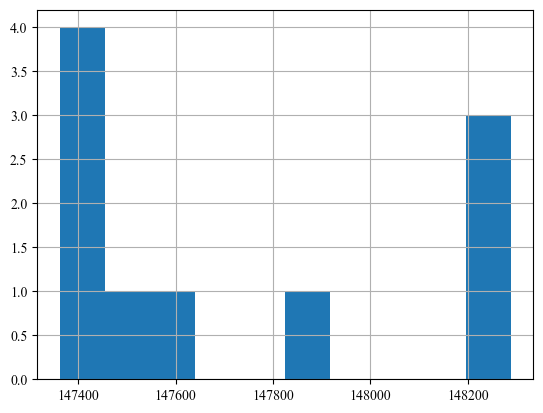

In [238]:
saved_steps_df[saved_steps_df['mi'] == 1/4]['chosen_sample']['count_order'].hist()

In [239]:
if ('mean' in OUTPUT_COLS):
    print("Mean of chosen_sample['mean'] for mi = 1/32")
    saved_steps_df[saved_steps_df['mi'] == 1/32]['chosen_sample']['mean'].hist()

In [240]:
if ('mean' in OUTPUT_COLS):
    print("Mean of release['mean'] for mi = 1/32")
    saved_steps_df[saved_steps_df['mi'] == 1/32]['release']['mean'].hist()

In [241]:
### DEBUG: Save the variables from computing the PAC noises for later reverse engineering
#if GENERATE:
#    saved_pac_variables_df = pd.DataFrame(saved_pac_variables, columns=['mi', 'out_np_0', 'fin_var', 'sqrt_total_var', 'pac_noise', 'pac_noises_to_add', 'pac_release'])
#    saved_pac_variables_df.to_parquet(f'{OUTPUT_DIR}/saved_pac_variables.parquet')
#else:
#    saved_pac_variables_df = pq.read_table(f"{OUTPUT_DIR}/saved_pac_variables.parquet").to_pandas()
#saved_pac_variables_df.head()

### Computing PAC Errors

In [242]:
# functions to calculate errors
def absolute_scaled_error(est: np.ndarray, actual: np.ndarray) -> np.ndarray:
    return np.abs(est - actual)
def relative_error_percent(est: np.ndarray, actual: np.ndarray) -> np.ndarray:
    return (np.abs(est - actual) / actual) * 100

In [243]:
#OUTPUT_COLS = OUTPUT_COLS
ERROR_COLS = [*[f'absolute error {i}' for i in OUTPUT_COLS], *[f'relative error {i}' for i in OUTPUT_COLS]]

In [244]:
print(true_result)

[3.77420000e+06 5.32075388e+09 5.05409627e+09 5.25675133e+09
 2.55375871e+01 3.60021238e+04 5.01445971e-02 1.47790000e+05]


In [245]:
true_result = np.array(runquery(lineitem_df))

(147790, 16)


In [246]:
# compute errors for PAC (or import from saved file)
if GENERATE:
    errors_list = []
    for i, row in df.iterrows():
        print(row)
        mi = row['mi']
        r = row[OUTPUT_COLS].to_numpy()
        errors_list.append([mi, *absolute_scaled_error(r, true_result), *relative_error_percent(r, true_result)])
    pac_errors_df = pd.DataFrame(errors_list, columns=['mi', *ERROR_COLS])
    pac_errors_df.to_parquet(f"{OUTPUT_DIR}/pac_errors.parquet")  # overwrite saved
else:
    pac_errors_df = pq.read_table(f"{OUTPUT_DIR}/pac_errors.parquet").to_pandas()
pac_errors_df

mi                1.248319e-03
sum_qty           4.999472e+08
sum_base_price             NaN
sum_disc_price             NaN
sum_charge        5.280049e+09
avg_qty          -8.172053e+05
avg_price                  NaN
avg_disc         -7.649411e+05
count_order      -9.911288e+06
Name: 0, dtype: float64
mi                1.248319e-03
sum_qty                    NaN
sum_base_price    5.207600e+09
sum_disc_price             NaN
sum_charge        5.861528e+09
avg_qty           3.659094e+07
avg_price         8.626859e+06
avg_disc         -1.469785e+07
count_order                NaN
Name: 1, dtype: float64
mi                1.248319e-03
sum_qty           1.659111e+08
sum_base_price    5.733817e+09
sum_disc_price    5.474995e+09
sum_charge        6.197509e+09
avg_qty                    NaN
avg_price         1.218082e+07
avg_disc         -1.658101e+08
count_order      -9.961239e+06
Name: 2, dtype: float64
mi                1.248319e-03
sum_qty           1.110847e+09
sum_base_price    4.758439e+0

,mi,absolute error sum_qty,absolute error sum_base_price,absolute error sum_disc_price,absolute error sum_charge,absolute error avg_qty,absolute error avg_price,absolute error avg_disc,absolute error count_order,relative error sum_qty,relative error sum_base_price,relative error sum_disc_price,relative error sum_charge,relative error avg_qty,relative error avg_price,relative error avg_disc,relative error count_order
0,0.001248,4.961730e+08,NaN,NaN,2.329803e+07,8.172308e+05,NaN,7.649411e+05,1.005908e+07,13146.440623,NaN,NaN,0.443202,3.200110e+06,NaN,1.525471e+09,6806.331892
1,0.001248,NaN,1.131537e+08,NaN,6.047767e+08,3.659092e+07,8.590857e+06,1.469785e+07,NaN,NaN,2.126648,NaN,11.504761,1.432826e+08,23862.083391,2.931094e+10,NaN
2,0.001248,1.621369e+08,4.130635e+08,4.208990e+08,9.407576e+08,NaN,1.214482e+07,1.658101e+08,1.010903e+07,4295.927102,7.763252,8.327879,17.896178,NaN,33733.614050,3.306640e+11,6840.130808
3,0.001248,1.107073e+09,5.623149e+08,4.775783e+07,NaN,1.358495e+08,NaN,9.989122e+06,5.639208e+07,29332.642569,10.568331,0.944933,NaN,5.319589e+08,NaN,1.992063e+10,38156.896157
4,0.001248,4.600324e+08,NaN,NaN,9.411478e+07,1.927561e+08,NaN,1.389115e+08,1.138517e+08,12188.870798,NaN,NaN,1.790360,7.547936e+08,NaN,2.770218e+11,77036.149320
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,16.000000,1.799532e+06,NaN,NaN,4.958236e+06,2.808602e+05,NaN,1.589695e+06,7.070140e+04,47.679832,NaN,NaN,0.094321,1.099791e+06,NaN,3.170221e+09,47.839096
86,16.000000,NaN,8.798916e+06,8.006509e+06,1.579829e+07,9.760933e+03,NaN,2.291182e+05,4.707259e+05,NaN,0.165370,0.158416,0.300533,3.822183e+04,NaN,4.569149e+08,318.509948
87,16.000000,1.691867e+06,1.649996e+07,1.819903e+07,1.676447e+07,2.443622e+06,NaN,9.837927e+05,2.212184e+06,44.827170,0.310106,0.360085,0.318913,9.568728e+06,NaN,1.961912e+09,1496.842977
88,16.000000,3.219399e+06,5.734164e+06,1.260912e+07,NaN,1.332797e+06,NaN,2.380456e+06,2.568891e+06,85.300174,0.107770,0.249483,NaN,5.218961e+06,NaN,4.747183e+09,1738.203598


In [247]:
# if GENERATE:
#     mean_df = df.groupby('mi').mean()[['count', 'sum', 'mean', 'var']]
#     std_df = df.groupby('mi').std()[['count', 'sum', 'mean', 'var']].abs()
#     mean_df, std_df

#     # save mean_df, std_df to parquet
#     mean_df.to_parquet('{OUTPUT_DIR}/pac-mean_df_student-por.parquet')
#     std_df.to_parquet('{OUTPUT_DIR}/pac-std_df_student-por.parquet')

### Computing DP Errors

### Analysis of PAC vs DP
- import the DP data
- create a dataframe (`all_df`) containing the query outputs
    - in this df, each output is the {mean, variance} aggregation over the 500 experiments, grouped by the type of privacy mechanism used (pac or dp) and privacy factor (mi or epsilon)
- create a dataframe in the same pattern containing the computed error for each privitized output

In [248]:
%%script echo skipping# Import Chais saved data from running PipelineDP and use it to compare.
dp_results_df = pq.read_table(f"{OUTPUT_DIR}/dp-q4/dp_results.parquet").to_pandas()

# compute sum from count and mean
dp_results_df['sum'] = dp_results_df['count'] * dp_results_df['mean']
dp_results_df = dp_results_df[['mi', 'count', 'sum', 'mean']]

# filter to just MI_OPTIONS
dp_results_df = dp_results_df[dp_results_df['mi'].isin(MI_OPTIONS)]

dp_results_df

skipping# Import Chais saved data from running PipelineDP and use it to compare.


In [249]:
%%script echo skipping# compute errors for DP (or import from saved file)
GENERATE_DP = True
if GENERATE_DP:
    errors_list = []
    for i, row in dp_results_df.iterrows():
        mi = row['mi']
        r = row[OUTPUT_COLS].to_numpy()
        errors_list.append([mi, *absolute_scaled_error(r, true_result), *relative_error_percent(r, true_result)])
    dp_errors_df = pd.DataFrame(errors_list, columns=['mi', *ERROR_COLS])
    dp_errors_df.to_parquet(f"{OUTPUT_DIR}/dp-q4/dp_errors.parquet")  # overwrite saved
else:
    dp_errors_df = pq.read_table(f"{OUTPUT_DIR}/dp-q4/dp_errors.parquet").to_pandas()
dp_errors_df

skipping# compute errors for DP (or import from saved file)


In [250]:
### Make one merged DF to compare results
all_df = pd.concat([  # we will call mi and epsilon the "factor" so that the schemas match
    #dp_results_df.assign(type='dp').rename(columns={'eps': 'factor'}), # switch from eps to mi for indexing DP results
    #dp_results_df.assign(type='dp').rename(columns={'mi': 'factor'}), # comment out DP results until we have some
    df.assign(type='pac').rename(columns={'mi': 'factor'})
])
all_df = all_df.groupby(['type', 'factor']).agg(['mean', 'var'])
all_df.columns = [' '.join(col).strip() for col in all_df.columns.values]  # Flatten the columns
#all_df.to_parquet(f"{OUTPUT_DIR}/all_results.parquet")  # Save the merged results
all_df

sum_qty mean   sum_qty var  sum_base_price mean  \
type factor                                                       
pac  0.001248   3.382034e+08  1.569476e+17         5.369111e+09   
     0.015625  -2.502809e+05  6.182411e+15         5.271914e+09   
     0.031250  -8.734691e+06  4.114780e+15         5.262757e+09   
     0.062500  -1.400602e+07  2.752550e+15         5.360406e+09   
     0.250000   7.088234e+06  9.103845e+14         5.341865e+09   
     1.000000   2.460278e+06  2.379345e+14         5.332178e+09   
     2.000000   6.537543e+06  1.543332e+14         5.320229e+09   
     4.000000   4.743299e+06  4.926391e+13         5.320425e+09   
     16.000000  2.713538e+06  7.956026e+12         5.322128e+09   

                sum_base_price var  sum_disc_price mean  sum_disc_price var  \
type factor                                                                   
pac  0.001248         1.572774e+17         5.021842e+09        8.353739e+16   
     0.015625         1.794495e+16         4.962383e+09        9.368796e+15   
     0.031250         3.890604e+15         5.064648e+09        4.263112e+15   
     0.062500         3.372748e+15         5.084522e+09        2.716667e+15   
     0.250000         5.507392e+14         5.056990e+09        1.351400e+15   
     1.000000         1.988390e+14         5.062405e+09        2.070106e+14   
     2.000000         1.999489e+14         5.053604e+09        6.838102e+13   
     4.000000         7.358995e+14         5.058760e+09        4.317765e+14   
     16.000000        2.380593e+14         5.056652e+09        3.673118e+14   

                sum_charge mean  sum_charge var  avg_qty mean   avg_qty var  \
type factor                                                                   
pac  0.001248      5.566242e+09    1.553406e+17  3.995489e+07  2.143510e+16   
     0.015625      5.260084e+09    1.194625e+16  8.369014e+06  8.058707e+14   
     0.031250      5.240426e+09    8.610968e+15 -1.066361e+07  5.544469e+14   
     0.062500      5.241702e+09    2.374095e+15 -2.577489e+05  1.313081e+14   
     0.250000      5.245477e+09    4.351735e+14 -3.397688e+06  4.258538e+13   
     1.000000      5.258068e+09    2.100133e+14 -2.515304e+06  2.773170e+13   
     2.000000      5.258490e+09    1.226978e+14 -2.968995e+05  2.571747e+13   
     4.000000      5.252878e+09    4.256525e+14 -1.117785e+05  1.167852e+13   
     16.000000     5.253815e+09    1.886569e+14 -4.252942e+05  9.063107e+11   

                avg_price mean  avg_price var  avg_disc mean  avg_disc var  \
type factor                                                                  
pac  0.001248     1.040384e+07   6.315318e+12  -5.331858e+07  4.596487e+15   
     0.015625     1.481872e+07   8.800323e+13  -1.791239e+07  4.313789e+14   
     0.031250     2.498042e+06   5.080788e+13  -5.374373e+06  6.777366e+14   
     0.062500    -8.442241e+05   4.144881e+11   7.239750e+06  2.583988e+14   
     0.250000    -2.009418e+06   5.793924e+11  -1.047817e+06  7.095517e+13   
     1.000000     1.729380e+06   4.876435e+12   1.067002e+06  1.359686e+13   
     2.000000     4.046360e+05   3.256402e+06  -9.935191e+05  6.287941e+12   
     4.000000     5.818310e+05   8.323856e+11   4.248958e+05  2.281257e+12   
     16.000000    1.517744e+05   9.083584e+10   2.065457e+05  1.447217e+12   

                count_order mean  count_order var  
type factor                                        
pac  0.001248      -2.573353e+07     1.561401e+16  
     0.015625       2.199336e+06     2.645182e+15  
     0.031250       1.184492e+07     6.218917e+14  
     0.062500      -8.269518e+06     2.417970e+14  
     0.250000       5.026407e+06     1.058422e+14  
     1.000000       1.522153e+06     2.809542e+13  
     2.000000       1.355991e+06     1.627323e+13  
     4.000000       4.529136e+04     1.636597e+13  
     16.000000     -5.412183e+05     2.421812e+12

In [251]:
### Make another merged df for the errors
errors_df = pd.concat([  # we will call mi and epsilon the "factor" so that the schemas match
    #dp_errors_df.assign(type='dp').rename(columns={'eps': 'factor'}), # switch from eps to mi for indexing DP results
    #dp_errors_df.assign(type='dp').rename(columns={'mi': 'factor'}), # comment out DP results until we have some
    pac_errors_df.assign(type='pac').rename(columns={'mi': 'factor'})
])
errors_df = errors_df.groupby(['type', 'factor']).agg(['mean', 'var'])
# drop absolute * mean and relative * var columns from level 1
#errors_df = errors_df.drop(columns=[('absolute error count', 'mean'), ('absolute error mean', 'mean'), ('relative error count', 'var'), ('relative error mean', 'var')])
errors_df.columns = [' '.join(col).strip() for col in errors_df.columns.values]  # flatten the columns

#errors_df.to_parquet(f"{OUTPUT_DIR}/all_errors.parquet")
errors_df

absolute error sum_qty mean  absolute error sum_qty var  \
type factor                                                               
pac  0.001248                  3.737740e+08                1.251029e+17   
     0.015625                  5.740973e+07                2.434205e+15   
     0.031250                  5.244363e+07                1.150367e+15   
     0.062500                  3.812805e+07                1.452422e+15   
     0.250000                  2.017530e+07                4.577445e+14   
     1.000000                  1.161761e+07                8.565754e+13   
     2.000000                  9.408644e+06                6.189145e+13   
     4.000000                  5.682109e+06                1.343853e+13   
     16.000000                 2.537654e+06                1.882098e+12   

                absolute error sum_base_price mean  \
type factor                                          
pac  0.001248                         3.332776e+08   
     0.015625                         1.006125e+08   
     0.031250                         7.221636e+07   
     0.062500                         4.933117e+07   
     0.250000                         2.952747e+07   
     1.000000                         1.570453e+07   
     2.000000                         1.048410e+07   
     4.000000                         1.749314e+07   
     16.000000                        1.203333e+07   

                absolute error sum_base_price var  \
type factor                                         
pac  0.001248                        2.679481e+16   
     0.015625                        8.659927e+15   
     0.031250                        1.668765e+15   
     0.062500                        2.339199e+15   
     0.250000                        3.930560e+13   
     1.000000                        5.950325e+13   
     2.000000                        6.838028e+13   
     4.000000                        3.688168e+14   
     16.000000                       6.656216e+13   

                absolute error sum_disc_price mean  \
type factor                                          
pac  0.001248                         2.197174e+08   
     0.015625                         1.030737e+08   
     0.031250                         5.092910e+07   
     0.062500                         4.167299e+07   
     0.250000                         2.366530e+07   
     1.000000                         1.255683e+07   
     2.000000                         5.581258e+06   
     4.000000                         1.502667e+07   
     16.000000                        1.487936e+07   

                absolute error sum_disc_price var  \
type factor                                         
pac  0.001248                        2.449316e+16   
     0.015625                        6.602785e+15   
     0.031250                        1.160070e+15   
     0.062500                        1.703000e+15   
     0.250000                        6.618071e+14   
     1.000000                        9.621851e+13   
     2.000000                        2.974557e+13   
     4.000000                        1.767094e+14   
     16.000000                       9.873469e+13   

                absolute error sum_charge mean  absolute error sum_charge var  \
type factor                                                                     
pac  0.001248                     3.668702e+08                   1.109873e+17   
     0.015625                     8.710742e+07                   3.287286e+15   
     0.031250                     7.267884e+07                   2.878760e+15   
     0.062500                     3.590333e+07                   1.159727e+15   
     0.250000                     1.906992e+07                   1.648223e+14   
     1.000000                     9.633346e+06                   1.059373e+14   
     2.000000                     8.440246e+06                   4.473700e+13   
     4.000000                     1.662472e+07                   1.269363e+14   
     16.000000        

In [252]:
#abs_error = errors_df.groupby('mi').mean()[['absolute error count', 'absolute error sum', 'absolute error mean', 'absolute error var']]
#rel_error = errors_df.groupby('mi').mean()[['relative error count', 'relative error sum', 'relative error mean', 'relative error var']]

#std_abs_error = errors_df.groupby('mi').std()[['absolute error count', 'absolute error sum', 'absolute error mean', 'absolute error var']]
#sample_mean_rel_error = errors_df.groupby('mi').mean()[['relative error count', 'relative error sum', 'relative error mean', 'relative error var']]

# save std_abs_error, sample_mean_rel_error to parquet
# std_abs_error.to_parquet('outputs/pac-std_abs_error_student-por.parquet')
# sample_mean_rel_error.to_parquet('outputs/pac-sample_mean_rel_error_student-por.parquet')

### Plotting Results

We are reproducing Table 14 from this paper: http://arxiv.org/abs/2109.10789

> TABLE 14: Experiments of the queries count, sum, mean, and var on the attribute Absences of the Portuguese education dataset containing 649 individuals (500 experiments per ε).

In [253]:
### Imports for matplotlib
import matplotlib as mpl
#import seaborn as sns
import matplotlib.pyplot as plt
#sns.reset_orig()

# Michael's matplotlib defaults
# set font to Times New Roman
LATEX = False
if LATEX:
    mpl.rcParams['text.usetex'] = True
    mpl.rcParams["font.family"] = "serif"
    mpl.rcParams["font.serif"] = "Times"
else:
    mpl.rcParams['text.usetex'] = False
    mpl.rcParams["font.family"] = "Times New Roman"
    mpl.rcParams["mathtext.fontset"] = "stix"
    
plt.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['savefig.dpi'] = 300

import matplotlib_inline.backend_inline
#matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

mpl.rcParams['axes.titleweight'] = 'bold'

In [254]:
import matplotlib.colors as mcolors

PAC_COLOR = 'tab:blue'
DP_COLOR = 'tab:red'

# Function to lighten a color by blending with white
def lighten_color(color, amount=0.3):
    rgba = mcolors.to_rgba(color)
    return tuple(np.clip(np.array(rgba[:3]) + amount, 0, 1)) + (rgba[3],)

# Create lighter colors
PAC_LIGHT = lighten_color(PAC_COLOR, 0.3)
DP_LIGHT = lighten_color(DP_COLOR, 0.3)

# create legend, use color squares
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
pac_dp_legend_handles = [
    Patch(facecolor=PAC_COLOR, edgecolor=PAC_COLOR, label='PAC'),
    Patch(facecolor=DP_COLOR, edgecolor=DP_COLOR, label='DP')
]

Reproduction of Table 14 (PAC)

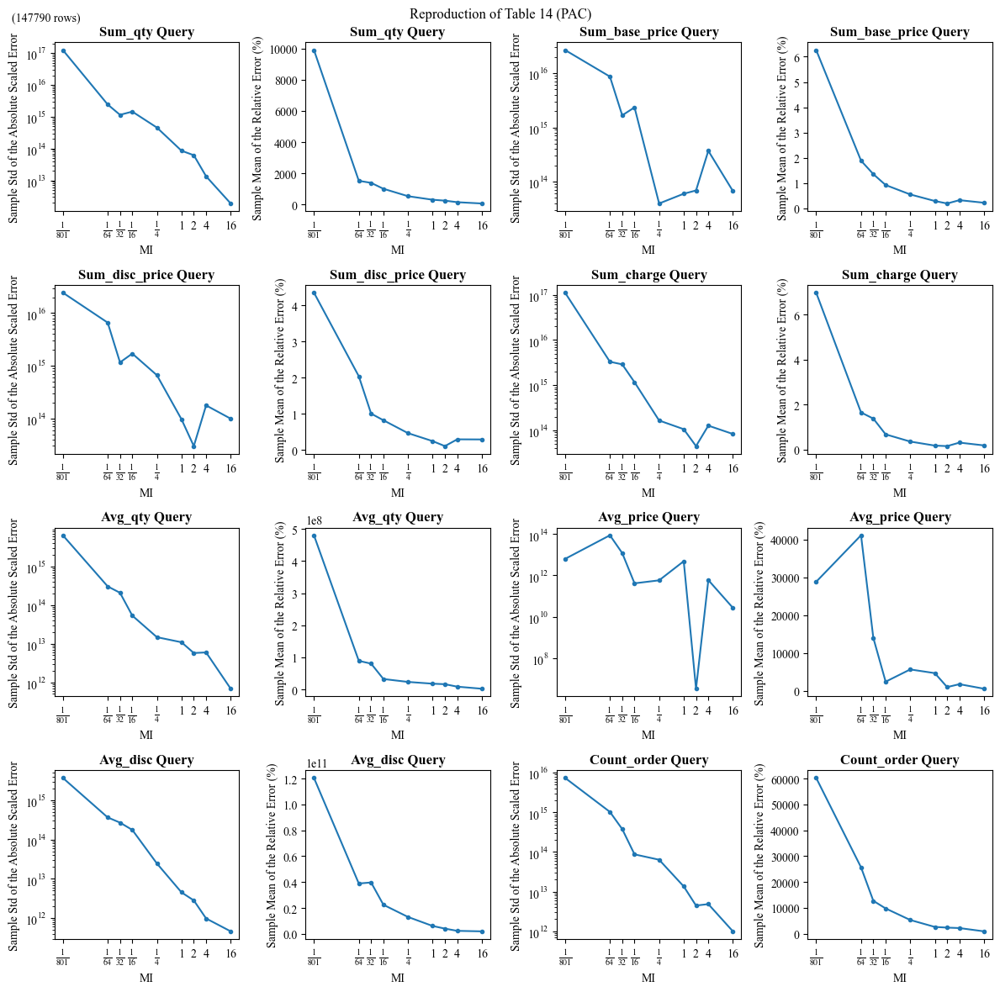

In [255]:
### Reproduction of Table 14 (PAC)
# Plotting each query type with their error metrics
fig, axs = plt.subplots(4, 4, figsize=(12, 12))
queries = OUTPUT_COLS
#MI_OPTIONS = [1/64, 1/32, 1/16, 1/4, 1., 2., 4., 16.]

# Loop through each query to create the subplots
for i, query in enumerate(queries):
    # go from top left, to top right, to bottom left, to bottom right
    row = (i*2)//4
    col = (i*2) % 4
    ax1 = axs[row][col]
    ax2 = axs[row][col+1]

    # Plotting Sample Std of Absolute Scaled Error
    TYPE = 'pac'
    d = errors_df.loc[TYPE].loc[:, f'absolute error {query} var']
    ax1.plot(d.index, d, label=query, marker='.', color=PAC_COLOR)
             #label=query, marker='.')

    ax1.set_yscale('log')

    ax1.set_xscale('log', base=2)
    xticks = MI_OPTIONS
    xlabels = [f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}' for x in xticks]
    ax1.set_xticks(xticks)
    ax1.set_xticklabels(xlabels)

    ax1.set_title(f'{query.capitalize()} Query')
    ax1.set_xlabel('MI')
    ax1.set_ylabel('Sample Std of the Absolute Scaled Error')

    # Plotting Sample Mean of the Relative Error (%)
    d = errors_df.loc[TYPE].loc[:, f'relative error {query} mean']
    ax2.plot(d.index, d, label=query, marker='.', color=PAC_COLOR)

    ax2.set_xscale('log', base=2)
    xticks = MI_OPTIONS
    xlabels = [f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}' for x in xticks]
    ax2.set_xticks(xticks)
    ax2.set_xticklabels(xlabels)

    ax2.set_title(f'{query.capitalize()} Query')
    ax2.set_xlabel('MI')
    ax2.set_ylabel('Sample Mean of the Relative Error (%)')

# add label in top left corner "sum = count * mean"
#fig.text(0.75, 0.95, '(sum = count * mean)', ha='center', va='center')
fig.text(0.05, 0.97, f'({number_of_contributing_rows} rows)', ha='center', va='center')
fig.suptitle("Reproduction of Table 14 (PAC)")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/table14_pac.jpg", bbox_inches='tight')
plt.show()

Reproduction of Table 14 (DP)

In [256]:
%%script echo skipping### Reproduction of Table 14 (DP)
# Plotting each query type with their error metrics
fig, axs = plt.subplots(2, 4, figsize=(12, 6))
queries = OUTPUT_COLS
#MI_OPTIONS = [1/256, 1/128, 1/64, 1/16, 1/4, 1., 2., 4., 16.]

# Loop through each query to create the subplots
for i, query in enumerate(queries):
    # go from top left, to top right, to bottom left, to bottom right
    row = (i*2)//4
    col = (i*2) % 4
    ax1 = axs[row][col]
    ax2 = axs[row][col+1]

    # Plotting Sample Std of Absolute Scaled Error
    TYPE = 'dp'
    d = errors_df.loc[TYPE].loc[:, f'absolute error {query} var']
    ax1.plot(d.index, d, label=query, marker='.', color=DP_COLOR)
             #label=query, marker='.')
    
    ax1.set_yscale('log')

    ax1.set_xscale('log', base=2)
    xticks = MI_OPTIONS
    xlabels = [f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}' for x in xticks]
    ax1.set_xticks(xticks)
    ax1.set_xticklabels(xlabels)

    ax1.set_title(f'{query.capitalize()} Query')
    ax1.set_xlabel('MI')
    ax1.set_ylabel('Sample Std of the Absolute Scaled Error')

    # Plotting Sample Mean of the Relative Error (%)
    d = errors_df.loc[TYPE].loc[:, f'relative error {query} mean']
    ax2.plot(d.index, d, label=query, marker='.', color=DP_COLOR)

    ax2.set_xscale('log', base=2)
    xticks = MI_OPTIONS
    xlabels = [f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}' for x in xticks]
    ax2.set_xticks(xticks)
    ax2.set_xticklabels(xlabels)

    ax2.set_title(f'{query.capitalize()} Query')
    ax2.set_xlabel('MI')
    ax2.set_ylabel('Sample Mean of the Relative Error (%)')

fig.suptitle("Reproduction of Table 14 (DP)")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/table14_dp.jpg", bbox_inches='tight')
plt.show()

skipping### Reproduction of Table 14 (DP)


Both on the same axes, aligned

In [257]:
%%script echo skipping
### Both on the same axes, aligned
# Plotting each query type with their error metrics
fig, axs = plt.subplots(2, 4, figsize=(12, 6))
queries = OUTPUT_COLS
#MI_OPTIONS = [1/256, 1/128, 1/64, 1/32, 1/16, 1/4, 1., 2., 4., 16.]

# Loop through each query to create the subplots
for i, query in enumerate(queries):
    # go from top left, to top right, to bottom left, to bottom right
    row = (i*2)//4
    col = (i*2) % 4
    ax1 = axs[row][col]
    ax2 = axs[row][col+1]

    # Plotting Sample Std of Absolute Scaled Error
    d = errors_df.loc['pac'].loc[:, f'absolute error {query} var']
    ax1.plot(d.index, d, label=query, marker='.', color=PAC_COLOR)

    d = errors_df.loc['dp'].loc[:, f'absolute error {query} var']
    #print(d)
    ax1.plot(d.index, d, label=query, marker='.', color=DP_COLOR)

    ax1.set_xscale('log', base=2)
    xticks = MI_OPTIONS
    xlabels = [f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}' for x in xticks]
    ax1.set_xticks(xticks)
    ax1.set_xticklabels(xlabels)

    ax1.set_title(f'{query.capitalize()} Query')
    ax1.set_ylabel('Sample Std of the Absolute Scaled Error')
    ax1.set_xlabel('MI')

    # Plotting Sample Mean of the Relative Error (%)
    d = errors_df.loc['pac'].loc[:, f'relative error {query} mean']
    ax2.plot(d.index, d, label=query, marker='.', color=PAC_COLOR)

    d = errors_df.loc['dp'].loc[:, f'relative error {query} mean']
    ax2.plot(d.index, d, label=query, marker='.', color=DP_COLOR)
    
    ax2.set_xscale('log', base=2)
    xticks = MI_OPTIONS
    xlabels = [f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}' for x in xticks]
    ax2.set_xticks(xticks)
    ax2.set_xticklabels(xlabels)

    ax2.set_title(f'{query.capitalize()} Query')
    ax2.set_ylabel('Sample Mean of the Relative Error (%)')
    ax2.set_xlabel('MI')

# add label in top left corner "sum = count * mean"
#fig.text(0.75, 0.94, '(sum = count * mean)', ha='center', va='center')

fig.legend(handles=pac_dp_legend_handles, loc='upper right', frameon=False)

fig.text(0.05, 0.97, f'({number_of_contributing_rows} rows)', ha='center', va='center')
fig.suptitle("Reproduction of Table 14 (PAC vs DP)")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/table14_pac_vs_dp.jpg", bbox_inches='tight')
plt.show()

skipping


# Additonal Extra Plotting

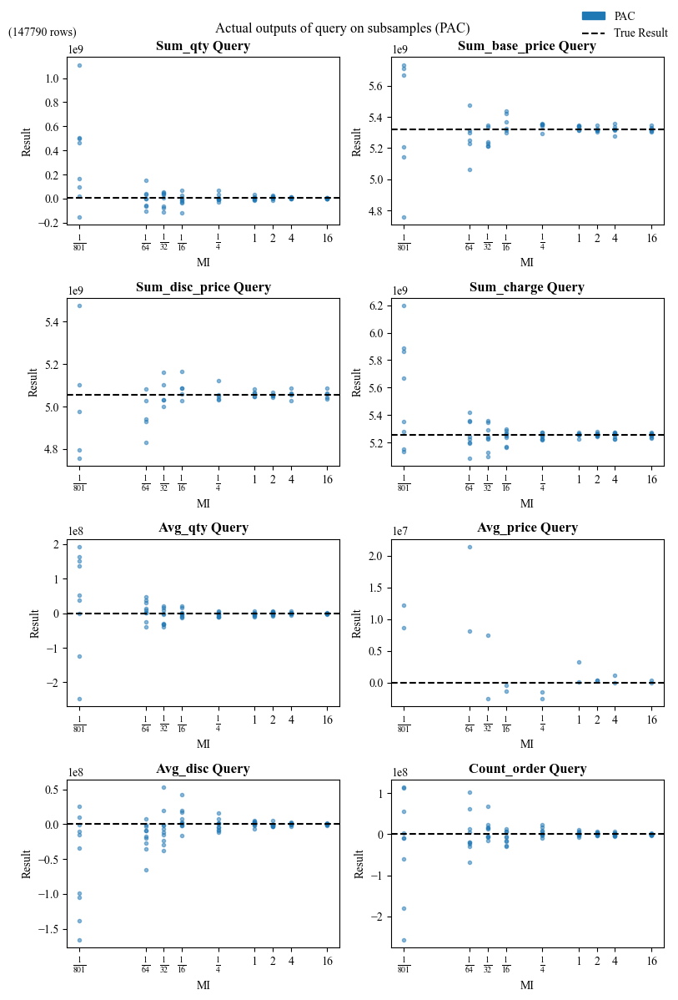

In [258]:
### Plotting the actual experiment outputs used (PAC)
# Plotting each query type with their error metrics
fig, axs = plt.subplots(4, 2, figsize=(8,12))
queries = OUTPUT_COLS
#MI_OPTIONS = [1/64, 1/32, 1/16, 1/4, 1., 2., 4., 16.]

# Loop through each query to create the subplots
for i, query in enumerate(queries):
    # go from top left, to top right, to bottom left, to bottom right
    row = i//2
    col = i%2
    ax = axs[row][col]

    TYPE = 'pac'
    ax.scatter(df['mi'], df[query], label=query, marker='.', alpha=0.5, color=PAC_COLOR)
    
    ax.axhline(y=true_result[i], color='black', linestyle='--', label='True Result')

    #for mi in MI_OPTIONS:
        #d = df.iloc[:, [0, i]].where(df['mi'] == mi).dropna()
        #ax.scatter(d.iloc[:, 0], d.iloc[:, 1], label=query, marker='.', alpha=0.5, color=PAC_COLOR)
        #ax.boxplot(d.iloc[:, 1], positions=[mi], widths=0.1, showfliers=False)
    
    ax.set_xscale('log', base=2)
    xticks = MI_OPTIONS
    xlabels = [f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}' for x in xticks]
    ax.set_xticks(xticks)
    ax.set_xticklabels(xlabels)

    ax.set_title(f'{query.capitalize()} Query')
    ax.set_xlabel('MI')
    ax.set_ylabel('Result')

fig.legend(handles=[
    Patch(facecolor=PAC_COLOR, edgecolor=PAC_COLOR, label='PAC'),
    Line2D([0], [0], color='black', linestyle='--', label='True Result')
], loc='upper right', frameon=False)

# add label in top left corner "sum = count * mean"
#fig.text(0.75, 0.94, '(sum = count * mean)', ha='center', va='center')
fig.text(0.05, 0.97, f'({number_of_contributing_rows} rows)', ha='center', va='center')
fig.suptitle("Actual outputs of query on subsamples (PAC)")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/actual_outputs_pac.jpg", bbox_inches='tight')
plt.show()

In [259]:
%%script echo skipping### Plotting the actual experiment outputs used (DP)
# Plotting each query type with their error metrics
fig, axs = plt.subplots(2, 2, figsize=(8, 6))
queries = OUTPUT_COLS
#MI_OPTIONS = [1/256, 1/128, 1/64, 1/16, 1/4, 1., 2., 4., 16.]

# Loop through each query to create the subplots
for i, query in enumerate(queries):
    # go from top left, to top right, to bottom left, to bottom right
    row = i//2
    col = i%2
    ax = axs[row][col]

    TYPE = 'dp'

    ax.scatter(dp_results_df['mi'], dp_results_df[query], label=query, marker='.', alpha=0.5, color=DP_COLOR)
    ax.axhline(y=true_result[i], color='black', linestyle='--', label='True Result')

    ax.set_xscale('log', base=2)
    xticks = MI_OPTIONS
    xlabels = [f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}' for x in xticks]
    ax.set_xticks(xticks)
    ax.set_xticklabels(xlabels)

    ax.set_title(f'{query.capitalize()} Query')
    ax.set_xlabel('MI')
    ax.set_ylabel('Result')

fig.legend(handles=[
    Patch(facecolor=DP_COLOR, edgecolor=DP_COLOR, label='DP'),
    Line2D([0], [0], color='black', linestyle='--', label='True Result')
], loc='upper right', frameon=False)

# add label in top left corner "sum = count * mean"
#fig.text(0.75, 0.94, '(sum = count * mean)', ha='center', va='center')

fig.suptitle("Actual outputs of query trials (DP)")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/actual_outputs_dp.jpg", bbox_inches='tight')
plt.show()

skipping### Plotting the actual experiment outputs used (DP)


In [260]:
%%script echo skipping### Both, but with side by side fig, axs = plt.subplots(2, 2, figsize=(8, 6))
fig, axs = plt.subplots(2, 2, figsize=(8, 6))
queries = OUTPUT_COLS
#MI_OPTIONS = [1/256, 1/128, 1/64, 1/32, 1/16, 1/4, 1., 2., 4., 16.]

# Loop through each query to create the subplots
for i, query in enumerate(queries):
    # go from top left, to top right, to bottom left, to bottom right
    row = i//2
    col = i%2
    ax = axs[row][col]

    ax.linewidth = 0.25

    # correct answer
    ax.axhline(y=true_result[i], color='gray', linestyle='--', label='True Result')

    for mi in MI_OPTIONS: # categorical variable
        position = MI_OPTIONS.index(mi) * 2

        TYPE = 'pac'

        pac_style = {
            'boxprops': dict(facecolor=PAC_LIGHT),
            'medianprops': dict(color='black')
        }
        
        # mi = mi and query is correct
        d = df[df['mi'] == mi][query].values
        ax.boxplot(d, positions=[position], widths=0.6, patch_artist=True, showfliers=False, **pac_style)

        position += 1
        TYPE = 'dp'

        dp_style = {
            'boxprops': dict(facecolor=DP_LIGHT),
            'medianprops': dict(color='black')
        }

        # mi = mi and query is correct
        d = dp_results_df[dp_results_df['mi'] == mi][query].values
        ax.boxplot(d, positions=[position], widths=0.6, patch_artist=True, showfliers=False, **dp_style)
    
    
    
    # override xticks, one for each pair of boxplots
    # the x axis is actually artificial here to plot both PAC and DP side by side
    xticks = [0.5+2*i for i in range(len(MI_OPTIONS))]
    ax.set_xticks(xticks)

    xlabels = [f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}' for x in MI_OPTIONS]
    ax.set_xticklabels(xlabels)

    ax.set_title(f'{query.capitalize()} Query')
    ax.set_xlabel('MI')
    ax.set_ylabel('Result')

fig.legend(handles=[
    Patch(facecolor=PAC_COLOR, edgecolor=PAC_COLOR, label='PAC'),
    Patch(facecolor=DP_COLOR, edgecolor=DP_COLOR, label='DP'),
    Line2D([0], [0], color='gray', linestyle='--', label='True Result')
], loc='upper right', frameon=False)

# add label in top left corner "sum = count * mean"
#fig.text(0.75, 0.94, '(sum = count * mean)', ha='center', va='center')
fig.text(0.05, 0.97, f'({number_of_contributing_rows} rows)', ha='center', va='center')
fig.suptitle("Actual outputs of query trials (PAC vs DP)")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/actual_outputs_dp_vs_pac.jpg", bbox_inches='tight')
plt.show()


skipping### Both, but with side by side fig, axs = plt.subplots(2, 2, figsize=(8, 6))


In [261]:
df.groupby('mi').var()

,sum_qty,sum_base_price,sum_disc_price,sum_charge,avg_qty,avg_price,avg_disc,count_order
mi,,,,,,,,
0.001248,1.569476e+17,1.572774e+17,8.353739e+16,1.553406e+17,2.143510e+16,6.315318e+12,4.596487e+15,1.561401e+16
0.015625,6.182411e+15,1.794495e+16,9.368796e+15,1.194625e+16,8.058707e+14,8.800323e+13,4.313789e+14,2.645182e+15
0.031250,4.114780e+15,3.890604e+15,4.263112e+15,8.610968e+15,5.544469e+14,5.080788e+13,6.777366e+14,6.218917e+14
0.062500,2.752550e+15,3.372748e+15,2.716667e+15,2.374095e+15,1.313081e+14,4.144881e+11,2.583988e+14,2.417970e+14
0.250000,9.103845e+14,5.507392e+14,1.351400e+15,4.351735e+14,4.258538e+13,5.793924e+11,7.095517e+13,1.058422e+14
1.000000,2.379345e+14,1.988390e+14,2.070106e+14,2.100133e+14,2.773170e+13,4.876435e+12,1.359686e+13,2.809542e+13
2.000000,1.543332e+14,1.999489e+14,6.838102e+13,1.226978e+14,2.571747e+13,3.256402e+06,6.287941e+12,1.627323e+13
4.000000,4.926391e+13,7.358995e+14,4.317765e+14,4.256525e+14,1.167852e+13,8.323856e+11,2.281257e+12,1.636597e+13
16.000000,7.956026e+12,2.380593e+14,3.673118e+14,1.886569e+14,9.063107e+11,9.083584e+10,1.447217e+12,2.421812e+12


In [262]:
# tables
from plottable import ColumnDefinition, Table
from plottable.cmap import normed_cmap

In [263]:
print("Scale of noise added to [Count, Mean] (scale param passed to Normal noise function)")
saved_steps_df[['mi','scale']].groupby('mi').mean()

Scale of noise added to [Count, Mean] (scale param passed to Normal noise function)


step              scale                                              \
query           sum_qty sum_base_price sum_disc_price    sum_charge   
mi                                                                    
0.001248   1.535673e+17   6.469520e+16   4.008633e+16  1.357299e+17   
0.015625   1.226886e+16   5.168655e+15   3.202593e+15  1.084379e+16   
0.031250   6.134431e+15   2.584327e+15   1.601296e+15  5.421895e+15   
0.062500   3.067215e+15   1.292164e+15   8.006482e+14  2.710947e+15   
0.250000   7.668038e+14   3.230409e+14   2.001621e+14  6.777368e+14   
1.000000   1.917010e+14   8.076023e+13   5.004051e+13  1.694342e+14   
2.000000   9.585048e+13   4.038011e+13   2.502026e+13  8.471710e+13   
4.000000   4.792524e+13   2.019006e+13   1.251013e+13  4.235855e+13   
16.000000  1.198131e+13   5.047514e+12   3.127532e+12  1.058964e+13   

step                                                               
query           avg_qty     avg_price      avg_disc   count_order  
mi                                                                 
0.001248   1.063086e+16 -1.130126e+15  1.241319e+16  1.357132e+16  
0.015625   8.493247e+14 -9.028851e+13  9.917193e+14  1.084245e+15  
0.031250   4.246623e+14 -4.514425e+13  4.958597e+14  5.421225e+14  
0.062500   2.123312e+14 -2.257213e+13  2.479298e+14  2.710613e+14  
0.250000   5.308279e+13 -5.643032e+12  6.198246e+13  6.776532e+13  
1.000000   1.327070e+13 -1.410758e+12  1.549561e+13  1.694133e+13  
2.000000   6.635349e+12 -7.053790e+11  7.747807e+12  8.470664e+12  
4.000000   3.317674e+12 -3.526895e+11  3.873904e+12  4.235332e+12  
16.000000  8.294186e+11 -8.817237e+10  9.684759e+11  1.058833e+12

Comparison of how much noise is added to the data, by looking at the variance of the distributions from which noise is sampled.

In [264]:
%%script echo skipping # Wait until we have DP data to compare
dp_var_noise = {  # from pipelinedp repo, dp_basic_mean_variances.csv
    #0.00390625: 0.2784089313555703,
    #0.0078125: 0.19648087910574175,
    0.015625: 0.13837628104247293,
    0.0625: 0.06750340282072995,
    0.25: 0.03001721300521553,
    1.0: 0.004282722801885366,
    2.0: 0.004282722801885366,
    4.0: 0.004282722801885366,
    16.0: 0.004282722801885366
}
d = dp_var_noise
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
plt.plot(d.keys(), d.values(), marker='.', label='DP', color=DP_COLOR)
plt.xlabel('MI')
ax.set_xticks(list(d.keys()))
ax.set_xticklabels([f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}' for x in d.keys()])
plt.suptitle('Noise added by DP to Mean query (scale param passed to Laplace noise function)')
plt.title('DP')
plt.savefig(f"{OUTPUT_DIR}/noise_distribution_scale_meanquery_dp.jpg", bbox_inches='tight')
plt.show()

skipping # Wait until we have DP data to compare


In [265]:
#assert not any(any(saved_steps_df[['mi','scale']].groupby('mi').var().values)) # assume we are only computing scale once per MI
if ('mean' in OUTPUT_COLS):
    pac_var_noise = dict(zip(MI_OPTIONS, saved_steps_df[['mi','scale']].groupby('mi').mean()[[('scale','mean')]].to_numpy().flatten()))
    pac_var_noise

In [266]:
# Let's compute the same for PAC: what is the scale of the distribution from which noise is sampled to add to PAC?
if ('mean' in OUTPUT_COLS): 
    fig, ax = plt.subplots(1, 1, figsize=(6, 4))
    d = pac_var_noise
    plt.plot(d.keys(), d.values(), marker='.', label='PAC', color=PAC_COLOR)
    plt.xlabel('MI')
    ax.set_xticks(list(d.keys()))
    ax.set_xticklabels([f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}' for x in d.keys()])
    plt.suptitle('Noise added by PAC to Mean query (scale param passed to Normal noise function)')
    plt.title('PAC')
    plt.savefig(f"{OUTPUT_DIR}/noise_distribution_scale_meanquery_pac.jpg", bbox_inches='tight')
    plt.show()

In [267]:
# How much of PAC error is due to sampling? Compute % error on our samples before noise was added
sample_errors = [relative_error_percent(s, true_result) for s in saved_steps_df['chosen_sample'].to_numpy()]
sample_errors_df = pd.DataFrame(sample_errors, columns=OUTPUT_COLS)
sample_errors_df.insert(0, 'mi', saved_steps_df['mi'].values)  # Insert 'mi' at the beginning
print("PAC: Error from Subsampling (as % of true_result, without any noise being added)")
#print("First output: overall mean / Second output: grouped by MI")
display(sample_errors_df[OUTPUT_COLS].mean())
display(sample_errors_df.groupby('mi').mean())

PAC: Error from Subsampling (as % of true_result, without any noise being added)


sum_qty           0.183094
sum_base_price    0.183215
sum_disc_price    0.178668
sum_charge        0.178800
avg_qty           0.134388
avg_price         0.159882
avg_disc          0.131821
count_order       0.160678
dtype: float64

Future exception was never retrieved
future: <Future finished exception=BrokenPipeError(32, 'Broken pipe')>
Traceback (most recent call last):
  File "/Library/Developer/CommandLineTools/Library/Frameworks/Python3.framework/Versions/3.9/lib/python3.9/asyncio/unix_events.py", line 665, in write
    n = os.write(self._fileno, data)
BrokenPipeError: [Errno 32] Broken pipe


,sum_qty,sum_base_price,sum_disc_price,sum_charge,avg_qty,avg_price,avg_disc,count_order
mi,,,,,,,,
0.001248,0.214212,0.253573,0.255344,0.257456,0.141754,0.182202,0.119840,0.167535
0.015625,0.122834,0.129287,0.122276,0.119692,0.120033,0.138318,0.079908,0.115299
0.031250,0.166525,0.142477,0.137434,0.136913,0.136855,0.151038,0.182589,0.208674
0.062500,0.161777,0.159733,0.152663,0.154485,0.105712,0.132468,0.137565,0.139928
0.250000,0.259430,0.259424,0.252036,0.253868,0.163386,0.208275,0.134536,0.248731
1.000000,0.154019,0.151330,0.148461,0.147101,0.133835,0.145585,0.140621,0.139116
2.000000,0.129018,0.127606,0.121082,0.122133,0.105938,0.139421,0.090136,0.089857
4.000000,0.234391,0.210091,0.203519,0.204388,0.144016,0.168900,0.184072,0.174572
16.000000,0.205638,0.215413,0.215200,0.213163,0.157960,0.172732,0.117118,0.162393


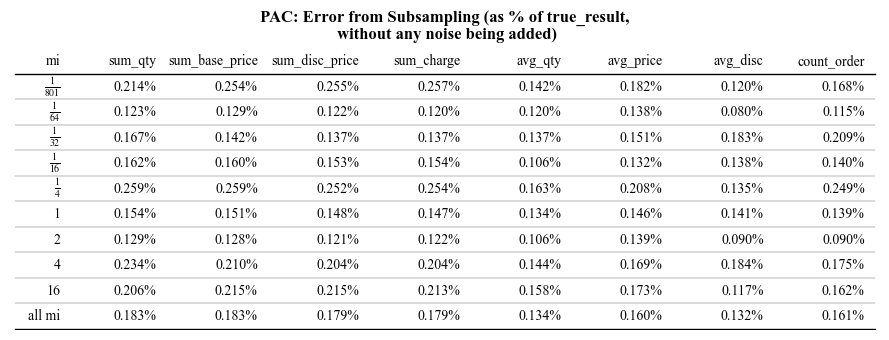

In [268]:
d=sample_errors_df.groupby('mi').mean()
d.loc['all mi'] = sample_errors_df[OUTPUT_COLS].mean()

fig, ax = plt.subplots(figsize=(5+(0.5*len(d.columns)), 3.5))

col_defs = [
    ColumnDefinition(
        name=d.index.name,
        #textprops={"ha": "right"},
        width=0.25,
        formatter=lambda x: (f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}') if type(x) != str else x,
    ),
    *[ColumnDefinition(
        name=c,
        textprops={"ha": "right"},
        width=0.5,
        formatter=lambda x: f"{x:.3f}%",
    ) for c in d.columns]]
tbl = Table(d,
    column_definitions=col_defs,
    row_dividers=True,
    footer_divider=True,
    ax=ax,
    #textprops={"fontsize": 14},
    #row_divider_kw={"linewidth": 1, "linestyle": (0, (1, 5))},
    #col_label_divider_kw={"linewidth": 1, "linestyle": "-"},
    #column_border_kw={"linewidth": 1, "linestyle": "-"},
    )
plt.title("PAC: Error from Subsampling (as % of true_result,\n without any noise being added)")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/tbl-pac_sample_error.jpg", bbox_inches='tight')
plt.show()

In [269]:
print("PAC: How much noise are we adding? (actual noise amounts sampled from the normal distribution, absolute value)")
# abs before mean
saved_steps_df[['mi', 'chosen_noise']].apply(lambda x: np.abs(x)).groupby('mi').mean().rename(columns={'chosen_noise': 'abs(chosen_noise)'})

PAC: How much noise are we adding? (actual noise amounts sampled from the normal distribution, absolute value)


/var/folders/g4/jxkqkb_d5170qh291jwd0t_h0000gn/T/ipykernel_79564/2429859456.py:3: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  saved_steps_df[['mi', 'chosen_noise']].apply(lambda x: np.abs(x)).groupby('mi').mean().rename(columns={'chosen_noise': 'abs(chosen_noise)'})


step      abs(chosen_noise)                                              \
query               sum_qty sum_base_price sum_disc_price    sum_charge   
mi                                                                        
0.001248       3.737761e+08   3.420570e+08   2.177162e+08  3.760953e+08   
0.015625       5.740652e+07   1.029498e+08   9.961301e+07  8.669074e+07   
0.031250       5.243986e+07   6.683499e+07   5.075921e+07  7.308600e+07   
0.062500       3.812596e+07   5.016191e+07   3.544657e+07  3.784657e+07   
0.250000       2.017568e+07   2.004632e+07   2.655179e+07  1.856060e+07   
1.000000       1.162109e+07   1.403383e+07   8.427973e+06  7.628492e+06   
2.000000       9.408556e+06   6.833442e+06   5.460297e+06  6.246864e+06   
4.000000       5.684762e+06   7.964637e+06   6.975078e+06  7.866456e+06   
16.000000      2.537852e+06   1.614494e+06   1.659741e+06  3.672685e+06   

step                                                               
query           avg_qty     avg_price      avg_disc   count_order  
mi                                                                 
0.001248   1.226084e+08  1.036790e+07  6.043135e+07  8.911969e+07  
0.015625   2.277726e+07  1.478264e+07  1.950541e+07  3.795460e+07  
0.031250   2.057506e+07  5.040183e+06  1.990866e+07  1.878318e+07  
0.062500   8.354341e+06  8.802420e+05  1.126284e+07  1.443469e+07  
0.250000   6.030654e+06  2.045338e+06  6.544069e+06  7.826547e+06  
1.000000   4.621599e+06  1.693370e+06  3.050857e+06  3.853385e+06  
2.000000   4.228321e+06  3.686666e+05  2.025716e+06  3.461651e+06  
4.000000   2.267425e+06  6.451106e+05  1.162370e+06  3.204436e+06  
16.000000  6.181877e+05  2.130501e+05  9.645813e+05  1.321908e+06

/var/folders/g4/jxkqkb_d5170qh291jwd0t_h0000gn/T/ipykernel_79564/211596906.py:1: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  d = saved_steps_df[['mi', 'chosen_noise']].apply(lambda x: np.abs(x)).groupby('mi').mean().rename(columns={'chosen_noise': 'abs(chosen_noise)'})


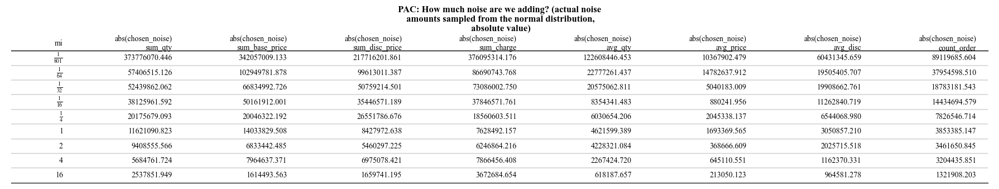

In [270]:
d = saved_steps_df[['mi', 'chosen_noise']].apply(lambda x: np.abs(x)).groupby('mi').mean().rename(columns={'chosen_noise': 'abs(chosen_noise)'})

fig, ax = plt.subplots(figsize=(2+(2*len(d.columns)), 3.5))

col_defs = [
    ColumnDefinition(
        name=d.index.name,
        #textprops={"ha": "right"},
        width=0.25,
        formatter=lambda x: (f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}') if type(x) != str else x,
    ),
    *[ColumnDefinition(
        name=c,
        title='\n'.join(c),
        textprops={"ha": "right"},
        width=0.5,
        formatter=lambda x: f"{x:.3f}",
    ) for c in d.columns]]
tbl = Table(d,
    column_definitions=col_defs,
    row_dividers=True,
    footer_divider=True,
    ax=ax,
    #textprops={"fontsize": 14},
    #row_divider_kw={"linewidth": 1, "linestyle": (0, (1, 5))},
    #col_label_divider_kw={"linewidth": 1, "linestyle": "-"},
    #column_border_kw={"linewidth": 1, "linestyle": "-"},
    )
plt.title("PAC: How much noise are we adding? (actual noise\n amounts sampled from the normal distribution,\n absolute value)")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/tbl-pac_chosen_noise.jpg", bbox_inches='tight')
plt.show()

In [271]:
print("Avg. value of unnoised sample used by PAC")
display(saved_steps_df[['mi', 'chosen_sample']].groupby('mi').mean())  # average per MI, shouldn't be different
display(saved_steps_df[['chosen_sample']].mean().to_frame(name='all mi').T)  # sample shouldn't change with MI, so we can find the overall average

Avg. value of unnoised sample used by PAC


/var/folders/g4/jxkqkb_d5170qh291jwd0t_h0000gn/T/ipykernel_79564/883409176.py:2: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  display(saved_steps_df[['mi', 'chosen_sample']].groupby('mi').mean())  # average per MI, shouldn't be different


step      chosen_sample                                              \
query           sum_qty sum_base_price sum_disc_price    sum_charge   
mi                                                                    
0.001248      3769892.4   5.313685e+09   5.047349e+09  5.249682e+09   
0.015625      3773078.0   5.319602e+09   5.052977e+09  5.255661e+09   
0.031250      3771486.2   5.317729e+09   5.050914e+09  5.253358e+09   
0.062500      3776823.8   5.322282e+09   5.055287e+09  5.258190e+09   
0.250000      3772369.0   5.320150e+09   5.053862e+09  5.256589e+09   
1.000000      3773717.8   5.320529e+09   5.053910e+09  5.256507e+09   
2.000000      3775436.6   5.321748e+09   5.054825e+09  5.257580e+09   
4.000000      3774971.6   5.320748e+09   5.053971e+09  5.256509e+09   
16.000000     3772933.6   5.318519e+09   5.052009e+09  5.254548e+09   

step                                                      
query        avg_qty     avg_price  avg_disc count_order  
mi                                                        
0.001248   25.517896  35967.570779  0.050142    147735.2  
0.015625   25.536839  36003.999133  0.050149    147750.4  
0.031250   25.535181  36004.171543  0.050207    147698.0  
0.062500   25.543121  35995.257694  0.050192    147860.8  
0.250000   25.535349  36012.343679  0.050109    147731.2  
1.000000   25.549277  36021.695238  0.050151    147703.6  
2.000000   25.535176  35993.674684  0.050169    147852.4  
4.000000   25.568322  36038.050906  0.050179    147642.4  
16.000000  25.546628  36011.846810  0.050144    147688.0

step   chosen_sample                                                         \
query        sum_qty sum_base_price sum_disc_price    sum_charge    avg_qty   
all mi  3.773412e+06   5.319444e+09   5.052789e+09  5.255403e+09  25.540865   

step                                          
query      avg_price avg_disc    count_order  
all mi  36005.401163  0.05016  147740.222222

/var/folders/g4/jxkqkb_d5170qh291jwd0t_h0000gn/T/ipykernel_79564/3303776140.py:1: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  d = saved_steps_df[['mi', 'chosen_sample']].groupby('mi').mean()


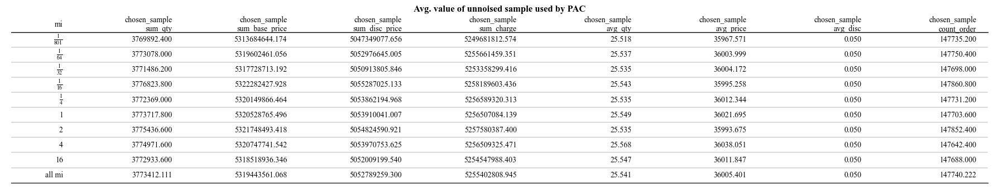

In [272]:
d = saved_steps_df[['mi', 'chosen_sample']].groupby('mi').mean()
d.loc['all mi'] = saved_steps_df[['chosen_sample']].mean()

fig, ax = plt.subplots(figsize=(2+(2*len(d.columns)), 3.5))

col_defs = [
    ColumnDefinition(
        name=d.index.name,
        #textprops={"ha": "right"},
        width=0.25,
        formatter=lambda x: (f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}') if type(x) != str else x,
    ),
    *[ColumnDefinition(
        name=c,
        title='\n'.join(c),
        textprops={"ha": "right"},
        width=0.5,
        formatter=lambda x: f"{x:.3f}",
    ) for c in d.columns]]
tbl = Table(d,
    column_definitions=col_defs,
    row_dividers=True,
    footer_divider=True,
    ax=ax,
    #textprops={"fontsize": 14},
    #row_divider_kw={"linewidth": 1, "linestyle": (0, (1, 5))},
    #col_label_divider_kw={"linewidth": 1, "linestyle": "-"},
    #column_border_kw={"linewidth": 1, "linestyle": "-"},
    )
plt.title("Avg. value of unnoised sample used by PAC")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/tbl-pac_unnoised_samples.jpg", bbox_inches='tight')
plt.show()

In [273]:
# How much total error is there in PAC? Compute % error on our samples after noise was added
total_errors = [relative_error_percent(s, true_result) for s in saved_steps_df['release'].to_numpy()]
total_errors_df = pd.DataFrame(total_errors, columns=OUTPUT_COLS)
total_errors_df.insert(0, 'mi', saved_steps_df['mi'].values)  # Insert 'mi' at the beginning
print("PAC: Total Error (as % of true_result)")
total_errors_df.groupby('mi').mean()

PAC: Total Error (as % of true_result)


,sum_qty,sum_base_price,sum_disc_price,sum_charge,avg_qty,avg_price,avg_disc,count_order
mi,,,,,,,,
0.001248,9903.397599,6.263728,4.347314,6.979028,4.801098e+08,28797.848720,1.205142e+11,60301.584262
0.015625,1521.109788,1.890945,2.039409,1.657058,8.919113e+07,41060.685464,3.889832e+10,25681.417972
0.031250,1389.529637,1.357258,1.007680,1.382581,8.056776e+07,13999.819265,3.970251e+10,12709.391245
0.062500,1010.228620,0.927146,0.824539,0.682995,3.271390e+07,2444.928540,2.246073e+10,9767.047177
0.250000,534.558392,0.554949,0.468240,0.362770,2.361482e+07,5681.387416,1.305040e+10,5295.636032
1.000000,307.816380,0.295156,0.248449,0.183257,1.809724e+07,4703.548952,6.084120e+09,2607.369190
2.000000,249.288434,0.197042,0.110430,0.160560,1.655725e+07,1023.922648,4.039748e+09,2342.280534
4.000000,150.551341,0.328772,0.297317,0.316255,8.878774e+06,1791.922277,2.318037e+09,2168.142835
16.000000,67.236883,0.226158,0.294402,0.191303,2.420697e+06,591.950655,1.923600e+09,894.493976


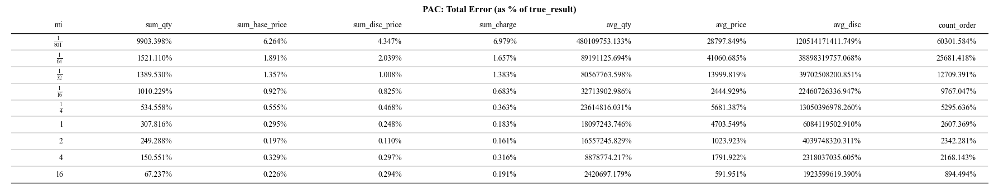

In [274]:
d=total_errors_df.groupby('mi').mean()

fig, ax = plt.subplots(figsize=(2+(2*len(d.columns)), 3.5))

col_defs = [
    ColumnDefinition(
        name=d.index.name,
        #textprops={"ha": "right"},
        width=0.25,
        formatter=lambda x: f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}',
    ),
    *[ColumnDefinition(
        name=c,
        textprops={"ha": "right"},
        width=0.5,
        formatter=lambda x: f"{x:.3f}%",
    ) for c in d.columns]]
tbl = Table(d,
    column_definitions=col_defs,
    row_dividers=True,
    footer_divider=True,
    ax=ax,
    #textprops={"fontsize": 14},
    #row_divider_kw={"linewidth": 1, "linestyle": (0, (1, 5))},
    #col_label_divider_kw={"linewidth": 1, "linestyle": "-"},
    #column_border_kw={"linewidth": 1, "linestyle": "-"},
    )
plt.title("PAC: Total Error (as % of true_result)")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/tbl-pac_error_total.jpg", bbox_inches='tight')
plt.show()

In [275]:
print("PAC: Increase in Avg. % error due to noise being added (as % of true_result)")
delta_error_from_noise = pd.concat(
    [
        saved_steps_df['mi'].reset_index(drop=True),
        pd.DataFrame(
            (np.array([relative_error_percent(s, true_result) for s in saved_steps_df['release'].to_numpy()]) -
             np.array([relative_error_percent(s, true_result) for s in saved_steps_df['chosen_sample'].to_numpy()])),
            columns=OUTPUT_COLS
        )
    ],
    axis=1
)
delta_error_from_noise.groupby('mi').mean()

PAC: Increase in Avg. % error due to noise being added (as % of true_result)


,sum_qty,sum_base_price,sum_disc_price,sum_charge,avg_qty,avg_price,avg_disc,count_order
mi,,,,,,,,
0.001248,9903.162974,6.002860,4.068136,6.739206,4.801098e+08,28797.667280,1.205142e+11,60301.408337
0.015625,1520.980860,1.710856,1.856400,1.575055,8.919113e+07,41060.460718,3.889832e+10,25681.299335
0.031250,1389.363589,1.206410,0.844324,1.301201,8.056776e+07,13999.682444,3.970251e+10,12709.163144
0.062500,1010.076535,0.770095,0.665992,0.507257,3.271390e+07,2444.863432,2.246073e+10,9766.905836
0.250000,534.318030,0.175991,0.118540,0.122292,2.361482e+07,5681.159664,1.305040e+10,5295.391842
1.000000,307.682988,0.151490,0.118308,0.037937,1.809724e+07,4703.417789,6.084120e+09,2607.224841
2.000000,249.137183,0.082587,-0.010236,0.057115,1.655725e+07,1023.831793,4.039748e+09,2342.192270
4.000000,150.280794,0.116566,0.061897,0.089101,8.878774e+06,1791.714788,2.318037e+09,2167.960444
16.000000,66.981160,-0.022301,0.031865,0.013535,2.420697e+06,591.770985,1.923600e+09,894.321660


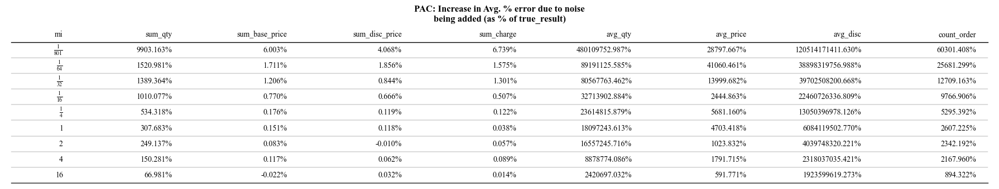

In [276]:
d=delta_error_from_noise.groupby('mi').mean()

fig, ax = plt.subplots(figsize=(2+(2*len(d.columns)), 3.5))

col_defs = [
    ColumnDefinition(
        name=d.index.name,
        #textprops={"ha": "right"},
        width=0.25,
        formatter=lambda x: f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}',
    ),
    *[ColumnDefinition(
        name=c,
        textprops={"ha": "right"},
        width=0.5,
        formatter=lambda x: f"{x:.3f}%",
    ) for c in d.columns]]
tbl = Table(d,
        column_definitions=col_defs,
        row_dividers=True,
        footer_divider=True,
        ax=ax,
        )
plt.title("PAC: Increase in Avg. % error due to noise\nbeing added (as % of true_result)")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/tbl-pac_error_noise.jpg", bbox_inches='tight')
plt.show()

In [277]:
sample_errors_df.head()

,mi,sum_qty,sum_base_price,sum_disc_price,sum_charge,avg_qty,avg_price,avg_disc,count_order
0,0.001248,0.226909,0.200994,0.194133,0.197618,0.135011,0.109072,0.171397,0.092022
1,0.001248,0.226909,0.200994,0.194133,0.197618,0.135011,0.109072,0.171397,0.092022
2,0.001248,0.444704,0.589917,0.598953,0.610047,0.108103,0.253808,0.132442,0.336965
3,0.001248,0.444704,0.589917,0.598953,0.610047,0.107377,0.252103,0.131552,0.336965
4,0.001248,0.050395,0.013638,0.010271,0.004809,0.215850,0.179032,0.048459,0.165099


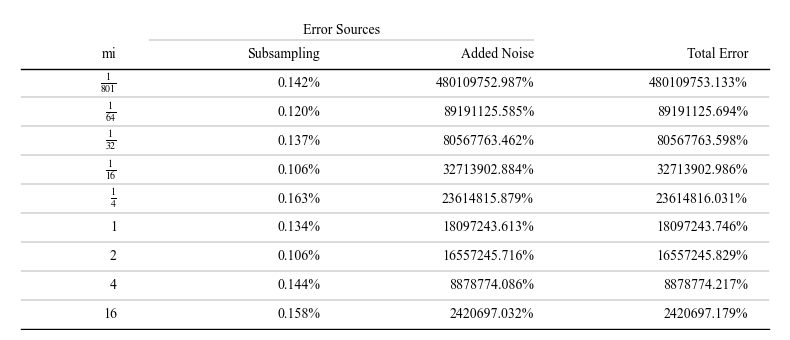

In [278]:
### Combined % Error Table
d = pd.concat([
    sample_errors_df[['mi', 'avg_qty']].groupby('mi').mean(),  # % error from subsampling
    delta_error_from_noise[['mi','avg_qty']].groupby('mi').mean(),  # % error from noise
    total_errors_df[['mi','avg_qty']].groupby('mi').mean(),  # % total error
], axis=1)
d.columns = ['Subsampling', 'Added Noise', 'Total Error']

fig, ax = plt.subplots(figsize=(2+(2*len(d.columns)), 3.5))

col_defs = [
    ColumnDefinition(
        name=d.index.name,
        #textprops={"ha": "right"},
        width=0.25,
        formatter=lambda x: f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}',
    ),
    *[ColumnDefinition(
        name=c,
        group="Error Sources",
        textprops={"ha": "right"},
        width=0.5,
        formatter=lambda x: f"{x:.3f}%",
    ) for c in d.columns[:-1]],
    ColumnDefinition(
        name=d.columns[-1],
        textprops={"ha": "right"},
        width=0.5,
        formatter=lambda x: f"{x:.3f}%",
    )]
tbl = Table(d,
            column_definitions=col_defs,
            row_dividers=True,
            footer_divider=True,
            ax=ax,
        )
#plt.title("PAC: Error Breakdown")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/tbl-pac_error_breakdown.jpg", bbox_inches='tight')
plt.show()

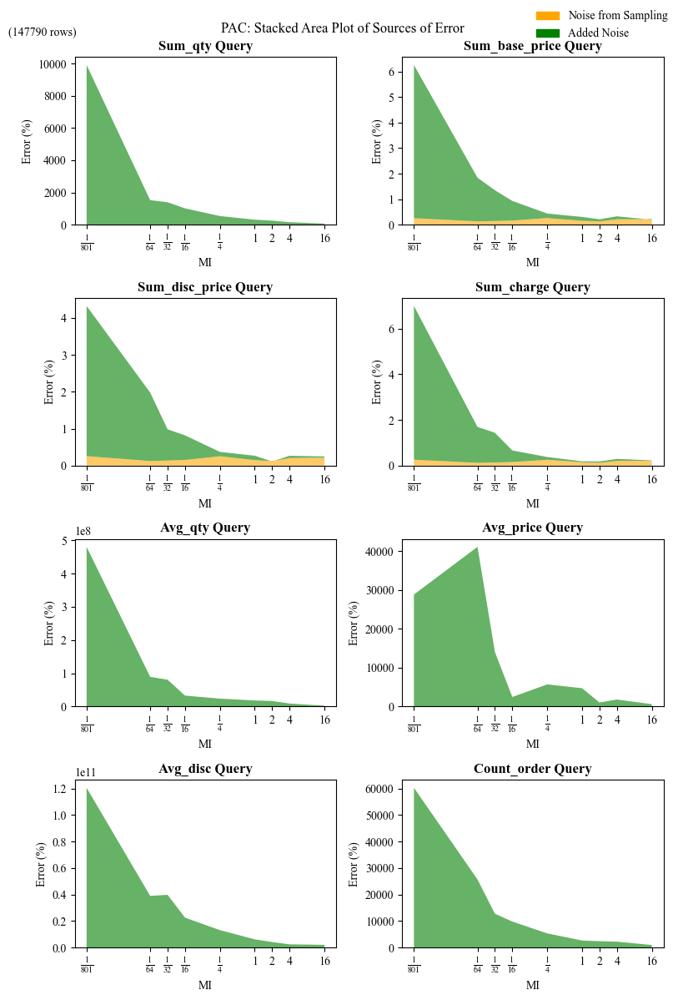

In [279]:
fig, axs = plt.subplots(4, 2, figsize=(8, 12))

psample_errors = sample_errors_df.groupby('mi').mean()
pnoise_errors = delta_error_from_noise.groupby('mi').mean()

for i, query in enumerate(OUTPUT_COLS):
    row = i//2
    col = i%2
    ax = axs[row][col]

    ax.stackplot(psample_errors.index, psample_errors[query], pnoise_errors[query], 
        labels=['Sample Error', 'Noise Error'], colors=['orange', 'green'], alpha=0.6)
    
    ax.set_xscale('log', base=2)
    xticks = MI_OPTIONS
    xlabels = [f'$\\frac{{1}}{{{int(1/x)}}}$' if x < 1 else f'{int(x)}' for x in xticks]
    ax.set_xticks(xticks)
    ax.set_xticklabels(xlabels)


    ax.set_title(f'{query.capitalize()} Query')
    ax.set_xlabel('MI')
    ax.set_ylabel('Error (%)')

fig.legend(handles=[
    Patch(facecolor='orange', edgecolor='orange', label='Noise from Sampling'),
    Patch(facecolor='green', edgecolor='green', label='Added Noise'),
], loc='upper right', frameon=False)

# add label in top left corner "sum = count * mean"
fig.text(0.05, 0.97, f'({number_of_contributing_rows} rows)', ha='center', va='center')
fig.suptitle("PAC: Stacked Area Plot of Sources of Error")
plt.tight_layout()
fig.savefig(f"{OUTPUT_DIR}/pac_error_breakdown.jpg", bbox_inches='tight')
plt.show()